# Densenet kernel for APTOS 2019 Competition

In this kernel, the procedure to train and develop this model is the following:

1. Loading Data
2. Preprocessing function
3. Data image generator with data augmentation
4. Metrics and saving model
5. Loading Model and submission

### Importing packages and hyperparameters

In [1]:
import json
import math
import os

import cv2
from PIL import Image
import numpy as np
from keras import layers
from keras.applications import DenseNet121
from keras.callbacks import Callback, ModelCheckpoint
from keras.preprocessing.image import ImageDataGenerator
from keras.models import Sequential
from keras.optimizers import Adam
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import cohen_kappa_score, accuracy_score
import scipy
import tensorflow as tf
from tqdm import tnrange, tqdm_notebook


%matplotlib inline

Using TensorFlow backend.


In [2]:
np.random.seed(2019)
tf.set_random_seed(2019)
NSIZE = 224
PREPROCESS_GAMMAX=10
BATCH_SIZE =32
SEED=2019

# Loading data

In this kernel, we are using multilabel data. Instead of predicting a single label, we will change our target to be a multilabel problem; i.e., if the target is a certain class, then it encompasses all the classes before it. E.g. encoding a class 4 retinopathy would usually be `[0, 0, 0, 1]`, but in our case we will predict `[1, 1, 1, 1]`. 

The idea is that if an eye has severe diabetic retinopathy, that also means that it has moderate and severe diabetic retinopathy

In [3]:

train_df = pd.read_csv('./aptos2019/train.csv')
print(train_df.shape)
train_df.head()
def get_label(diagnosis):
    return [i for i in range(diagnosis + 1)]
train_df['label'] = train_df.diagnosis.apply(get_label)
train_df['id_code'] = train_df['id_code'].apply(lambda x:  x + '.png')
print(train_df.head(10))

def label_convert(y_val):
    y_val = y_val.astype(int).sum(axis=1) - 1
    #y_val= np.argmax(y_val, axis=1)
    return y_val

(3662, 2)
            id_code  diagnosis            label
0  000c1434d8d7.png          2        [0, 1, 2]
1  001639a390f0.png          4  [0, 1, 2, 3, 4]
2  0024cdab0c1e.png          1           [0, 1]
3  002c21358ce6.png          0              [0]
4  005b95c28852.png          0              [0]
5  0083ee8054ee.png          4  [0, 1, 2, 3, 4]
6  0097f532ac9f.png          0              [0]
7  00a8624548a9.png          2        [0, 1, 2]
8  00b74780d31d.png          2        [0, 1, 2]
9  00cb6555d108.png          1           [0, 1]


# Preprocessing

Following the inspiration of [Ben's color](https://www.kaggle.com/ratthachat/aptos-updatedv14-preprocessing-ben-s-cropping), we do a crop image from gray and apply Ben's color

In [4]:

def ben_color (img) :
    img = cv2.addWeighted ( img,4, cv2.GaussianBlur( img , (0,0) , PREPROCESS_GAMMAX) ,-4 ,128)
    return img
def preprocess_image(img, color=False):
    def crop_image_from_gray(img,tol=7):
        if img.ndim ==2:
            mask = img>tol
            return img[np.ix_(mask.any(1),mask.any(0))]
        elif img.ndim==3:
            gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
            mask = gray_img>tol

            check_shape = img[:,:,0][np.ix_(mask.any(1),mask.any(0))].shape[0]
            if (check_shape == 0): # image is too dark so that we crop out everything,
                return img # return original image
            else:
                img1=img[:,:,0][np.ix_(mask.any(1),mask.any(0))]
                img2=img[:,:,1][np.ix_(mask.any(1),mask.any(0))]
                img3=img[:,:,2][np.ix_(mask.any(1),mask.any(0))]
                img = np.stack([img1,img2,img3],axis=-1)
            return img
    def circle_crop(img, sigmaX=10):   
        """
        Create circular crop around image centre    
        """    

        img = crop_image_from_gray(img)    
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        height, width, depth = img.shape    

        x = int(width/2)
        y = int(height/2)
        r = np.amin((x,y))

        circle_img = np.zeros((height, width), np.uint8)
        cv2.circle(circle_img, (x,y), int(r), 1, thickness=-1)
        img = cv2.bitwise_and(img, img, mask=circle_img)
        img = crop_image_from_gray(img)
        img = cv2.resize(img, (NSIZE, NSIZE))
        return img 
    img = crop_image_from_gray(img)
    
    img = cv2.resize(img, (NSIZE, NSIZE))
    img = ben_color(img)
    #im = im.resize((desired_size, )*2, resample=Image.LANCZOS)
    
    return img


CPU times: user 26.8 s, sys: 848 ms, total: 27.7 s
Wall time: 21 s


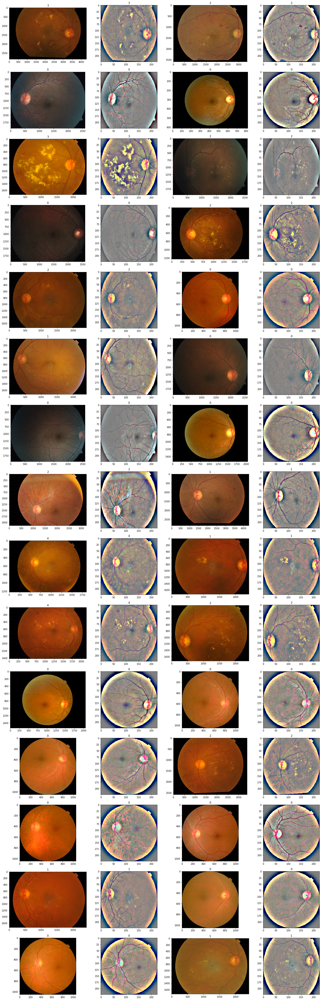

In [5]:
%%time
def preprocess_display(df, columns=4, rows=15, desired_size=NSIZE):
    
    fig=plt.figure(figsize=(5*columns, 4*rows))

    for i in range(columns*rows)[::2]:
        image_path = df.loc[i+200,'id_code']
        image_id = df.loc[i+200,'diagnosis']

        img = cv2.imread(f'./aptos2019/train_images/{image_path}')

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        imgProc = preprocess_image(img)
        fig.add_subplot(rows, columns, i+1)
        plt.title(image_id)
        plt.imshow(img)
        fig.add_subplot(rows, columns, i+2)
        plt.title(image_id)
        plt.imshow(imgProc)
    plt.tight_layout()

preprocess_display(train_df)

# Data Augmentation and Applying Preprocessing


In [6]:
def create_datagen():
    return ImageDataGenerator(
        zoom_range=[0.85,1],  # set range for random zoom
        #rotation_range=30,
        fill_mode="nearest",
        horizontal_flip=True,  # randomly flip images
        preprocessing_function=preprocess_image,
        validation_split=0.15
        
    )

data_gen=create_datagen().flow_from_dataframe(
    dataframe=train_df, 
    directory="./aptos2019/train_images/", 
    x_col='id_code', 
    y_col='label', 
    class_mode="categorical", 
    batch_size=BATCH_SIZE,
    target_size=(NSIZE,NSIZE),
    subset="training",
    seed=SEED)

val_gen=create_datagen().flow_from_dataframe(
    dataframe=train_df, 
    directory="./aptos2019/train_images/", 
    x_col='id_code', 
    y_col='label', 
    class_mode="categorical", 
    batch_size=128,
    target_size=(NSIZE,NSIZE),
    subset="validation",
    seed=SEED)


Found 3113 validated image filenames belonging to 5 classes.
Found 549 validated image filenames belonging to 5 classes.


/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/matplotlib/text.py:1191: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:
W0811 09:58:11.401831 140645565613824 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0811 09:58:11.417774 140645565613824 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0811 09:58:11.432820 140645565613824 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0811 09:58:11.447108 140645565613824 image.py:648] Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
W0811 09:58:11.460824 140645565613824 image.py:648] Clipping input data to the valid range for imshow with R

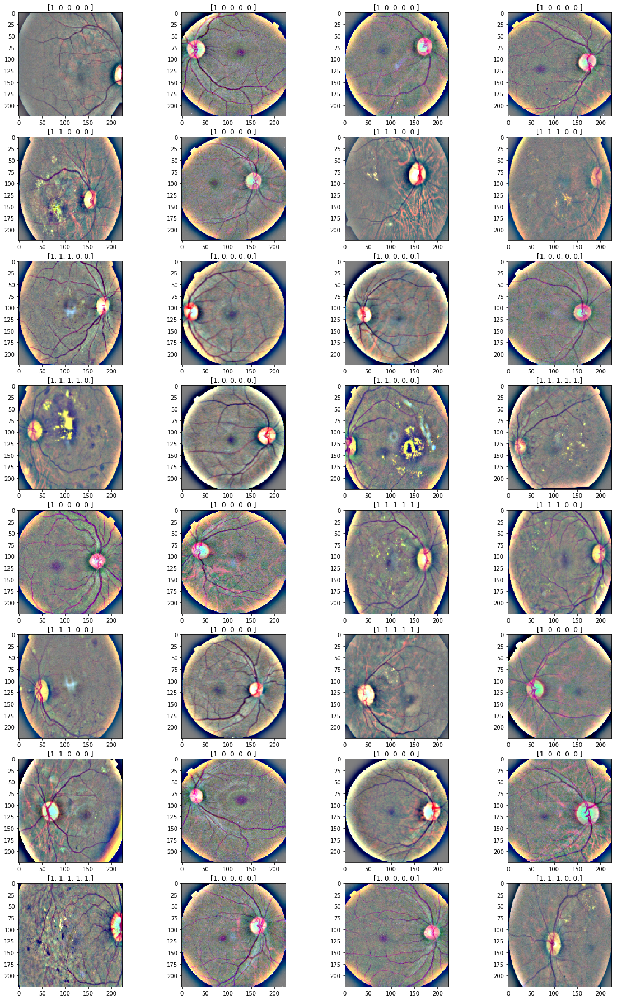

In [7]:
def display_generated_image(data_generator):
    for X, Y in data_generator:
        columns = 4
        rows = 8
        fig=plt.figure(figsize=(5*columns, 4*rows))
        for i in range(columns*rows):
            img = np.asarray(X[i].reshape(NSIZE,NSIZE,3),np.int32)

            fig.add_subplot(rows, columns, i+1)
            plt.title(Y[i])
            plt.imshow(img)

        plt.show()
        break
display_generated_image(data_gen)

# Saving model based on kappa score 
### What is the weighted kappa?

The wikipedia page offer a very concise explanation: 
> The weighted kappa allows disagreements to be weighted differently and is especially useful when **codes are ordered**. Three matrices are involved, the matrix of observed scores, the matrix of expected scores based on chance agreement, and the weight matrix. Weight matrix cells located on the diagonal (upper-left to bottom-right) represent agreement and thus contain zeros. Off-diagonal cells contain weights indicating the seriousness of that disagreement.

Simply put, if two scores disagree, then the penalty will depend on how far they are apart. That means that our score will be higher if (a) the real value is 4 but the model predicts a 3, and the score will be lower if (b) the model instead predicts a 0. This metric makes sense for this competition, since the labels 0-4 indicates how severe the illness is. Intuitively, a model that predicts a severe retinopathy (3) when it is in reality a proliferative retinopathy (4) is probably better than a model that predicts a mild retinopathy (1).

In [ ]:
class Metrics(Callback):
    def on_train_begin(self, logs={}):
        self.val_kappas = []

    def on_epoch_end(self, epoch, logs={}):
        
        for X_val, y_val in this.validation_data:
            y_val = label_convert(y_val)
            
            y_pred = self.model.predict(X_val) > 0.5
            y_pred = label_convert(y_pred)

            _val_kappa = cohen_kappa_score(
                y_val,
                y_pred, 
                weights='quadratic'
            )

            self.val_kappas.append(_val_kappa)

            print(f"val_kappa: {_val_kappa:.4f}")

            if _val_kappa == max(self.val_kappas):
                print("Validation Kappa has improved. Saving model.")
                self.model.save('densenet_model.h5')
            break


# Model: DenseNet-121

In [ ]:
densenet = DenseNet121(
    weights='../input/densenet-keras/DenseNet-BC-121-32-no-top.h5',
    include_top=False,
    input_shape=(224,224,3)
)

In [ ]:
def build_model():
    model = Sequential()
    model.add(densenet)
    model.add(layers.GlobalAveragePooling2D())
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(5, activation='sigmoid'))
    
    model.compile(
        loss='binary_crossentropy',
        optimizer=Adam(lr=0.00005),
        metrics=['accuracy']
    )
    
    return model
model = build_model()
model.summary()

In [ ]:
kappa_metrics = Metrics()

STEP_SIZE_TRAIN=data_gen.n//data_gen.batch_size
STEP_SIZE_VALID=val_gen.n//val_gen.batch_size

history = model.fit_generator(
    data_gen,
    steps_per_epoch=STEP_SIZE_TRAIN,
    epochs=15,
    validation_data=val_gen,
    validation_steps=STEP_SIZE_VALID,
    callbacks=[kappa_metrics],
    verbose=1
)

In [ ]:
with open('history.json', 'w') as f:
    json.dump(history.history, f)

history_df = pd.DataFrame(history.history)
history_df[['loss', 'val_loss']].plot()
history_df[['acc', 'val_acc']].plot()

In [ ]:
plt.plot(kappa_metrics.val_kappas)

# Predict

In [ ]:
model.load_weights('densenet_model.h5')


test_df = pd.read_csv('./aptos2019/test.csv')
test_df.head()
test_df['id_code'] = test_df['id_code'].apply(lambda x:  x + '.png')

test_datagen=ImageDataGenerator(
        preprocessing_function=preprocess_image,
)
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df, 
    directory="./aptos2019/test_images/", 
    x_col='id_code', 
    y_col=None,
    shuffle=False,
    class_mode=None,
    batch_size=1,
    target_size=(NSIZE,NSIZE)
)
STEP_SIZE_TEST=test_generator.n//test_generator.batch_size


predict_output=model.predict_generator(test_generator,
steps=STEP_SIZE_TEST,
verbose=1)

# Submit

In [ ]:

y_test= label_convert(predict_output > 0.5)
print(predict_output)

test_df = pd.read_csv('./aptos2019/test.csv')
print(y_test.shape)
test_df['diagnosis'] = y_test
test_df.to_csv('submission.csv',index=False)
print(test_df)